<a href="https://colab.research.google.com/github/gpicciuca/ai_engineering_master/blob/main/module7_torch_nn_optimization/Project_Performance_optimizations_of_a_NN_for_the_food_industry.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project: Performance optimization of a neural network for the food industry
Module 7: Applied Deep Learning with PyTorch @ Profession.AI <br>
Course: Master in AI Engineering <br>
Student: Giuseppe Picciuca



In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, SubsetRandomSampler
from torchvision.datasets import ImageFolder

import numpy as np
import pandas as pd
import PIL
import os
from dataclasses import dataclass

from sklearn.model_selection import train_test_split, KFold

import torchvision
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor

from torchvision.models import resnet152, ResNet152_Weights
from torchsummary import summary

import albumentations as A
from albumentations.pytorch import ToTensorV2

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Define the device (cuda or cpu) on which to load the model and its weights on:

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

# Helper methods
Methods that had no place elsewhere and wanted to live somewhere..

In [3]:
# Source: https://www.kaggle.com/code/avizyt/fast-food-classification-pytorch?scriptVersionId=183854783&cellId=14
image_mean = np.array([0.485, 0.456, 0.406])
image_std = np.array([0.229, 0.224, 0.225])

# Transforms a Tensor back into an RGB image buffer
def image_from_tensor(img_tensor):
    img = img_tensor.numpy().transpose((1, 2, 0))
    img = image_std * img + image_mean
    img = np.clip(img, 0, 1)
    return img

In [4]:
# Plots a set of images from the image_folder in a user-defined grid
def grid_plot(image_folder: ImageFolder, start_index=0, rows=5, cols=5, size=(12, 12)):
    plt.figure(figsize=size)
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        img, label = image_folder[start_index + i]
        img = transforms.functional.to_pil_image(image_from_tensor(img)) if isinstance(img, torch.Tensor) else img
        plt.imshow(img)
        plt.title(image_folder.classes[label])
    plt.tight_layout()
    plt.show()

In [5]:
def grid_plot_dataloader(loader: DataLoader, targets, predictions, classes, show_false_only = False, start_index=0, rows=5, cols=5, size=(12, 12)):
    plt.figure(figsize=size)
    i = 0

    for idx, (img, label) in enumerate(loader, 0):
        plt.subplot(rows, cols, i + 1)
        predicted_label = predictions[idx]
        actual_label = targets[idx]

        # DataLoader does not support indexing, so we hack our way around it
        if idx < start_index:
            continue

        if show_false_only and actual_label == predicted_label:
            continue

        img = transforms.functional.to_pil_image(image_from_tensor(img[0]))
        plt.imshow(img)
        plt.title(
            "%s" % classes[predicted_label],
            color="red" if actual_label != predicted_label else "green",
            fontsize=10,
        )
        plt.xlabel(classes[actual_label])

        i += 1
        if i >= rows * cols:
            break

    plt.tight_layout()
    plt.show()

In [6]:
def free_model_gradient(model):
    """
    Free the gradients of the model's parameters.

    Args:
        model (torch.nn.Module): The model to free.
    """
    for param in model.parameters():
        param.grad = None

def free_model_memory(model = None, optimizer = None):
    """
    Free the model and optimizer from memory.
    Useful for environments with restricted resources and limited memory.

    Args:
        model (torch.nn.Module): The model to free.
        optimizer (torch.optim.Optimizer): The optimizer to free.
    """
    import gc

    if model is not None:
        free_model_gradient(model)

        del model
        model = None

    if optimizer is not None:
        del optimizer
        optimizer = None

    gc.collect()
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()


In [31]:
def print_experiment_results(experiments):
    """
    Print the results of the experiments.
    Selects the validation accuracy at the lowest validation loss.

    Args:
        experiments (list): The list of experiments.
    """
    print("Experiment comparison based on validation:")

    for exp in experiments:
        exp_val_acc = []
        exp_val_loss = []

        for fold_exp in exp.fold_experiments:
            exp_val_acc = exp_val_acc + fold_exp.val_acc
            exp_val_loss = exp_val_loss + fold_exp.val_loss

        lowest_val_loss_idx = exp_val_loss.index(min(exp_val_loss))
        lowest_val_acc_idx = exp_val_acc[lowest_val_loss_idx]

        print("%s) Val Loss: %.4f - Val Acc: %.4f" % (exp.name, exp_val_loss[lowest_val_loss_idx], exp_val_acc[lowest_val_loss_idx]))

In [70]:
def plot_confusion_matrix(targets, predictions, classes):
    """
    Plot the confusion matrix.

    Args:
        targets (list): The list of targets.
        predictions (list): The list of predictions.
        classes (list): The list of classes.
    """
    sns.heatmap(confusion_matrix(targets, predictions), annot=True, cmap='Blues', fmt='g', xticklabels=classes, yticklabels=classes)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")

# Dataset download
We'll proceed by downloading the dataset first and then, through pytorch's ImageFolder class, provide a convenient way to access all images present within the dataset.

In [8]:
DATASET_URL = "https://proai-datasets.s3.eu-west-3.amazonaws.com/dataset_food_classification.zip"
!wget $DATASET_URL
!unzip -q dataset_food_classification.zip

--2025-05-29 07:41:29--  https://proai-datasets.s3.eu-west-3.amazonaws.com/dataset_food_classification.zip
Resolving proai-datasets.s3.eu-west-3.amazonaws.com (proai-datasets.s3.eu-west-3.amazonaws.com)... 52.95.156.32, 3.5.226.172
Connecting to proai-datasets.s3.eu-west-3.amazonaws.com (proai-datasets.s3.eu-west-3.amazonaws.com)|52.95.156.32|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1072486271 (1023M) [application/zip]
Saving to: ‘dataset_food_classification.zip’

dataset_food_classi 100%[===================>]   1023M  11.3MB/s    in 94s     

2025-05-29 07:43:03 (10.8 MB/s) - ‘dataset_food_classification.zip’ saved [1072486271/1072486271]



And abstract the subfolders by wrapping their content with ImageFolder, which provides an easy and convenient way to access all images directly. <br>
ImageFolder also allows to pass a transformation pipeline to augment the images (cropping, resizing, etc) but this can be done after exploring the raw data.

In [8]:
train_image_folder = ImageFolder("dataset/train")
test_image_folder = ImageFolder("dataset/test")
val_image_folder = ImageFolder("dataset/val")

# Dataset exploration
Let's visualize some of the images that we've got so that we can better understand the data we have at hand and how to deal with it. This step will also allow us to understand which kind of transformations to apply on the images before feeding them to the network.

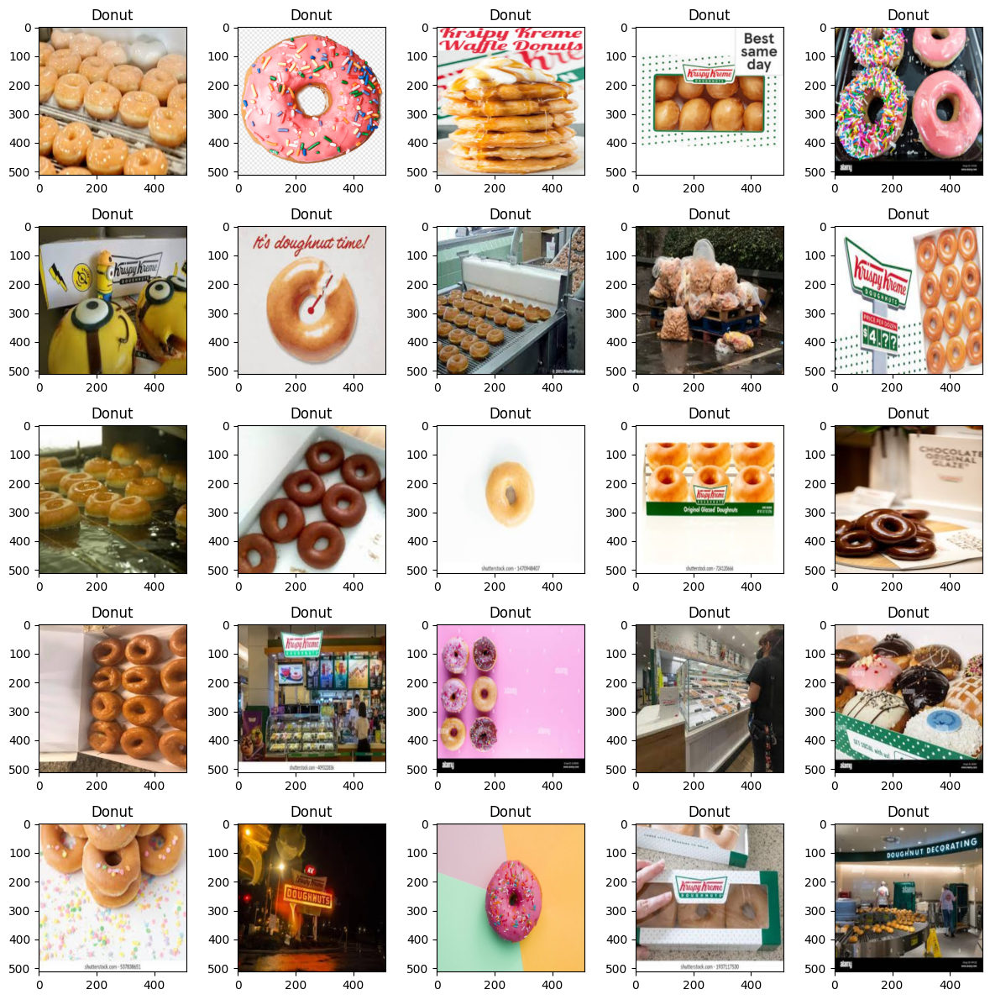

In [ ]:
grid_plot(test_image_folder, 500)

As we can see from the plots above, we've got a variety of images of different kinds, all with roughly 512x512 px in size:

In [ ]:
test_image_folder[0]

(<PIL.Image.Image image mode=RGB size=512x512>, 0)

Let's check the number of samples we have for each class:

In [ ]:
target_count_df = pd.DataFrame(train_image_folder.targets)
target_count_df[0] = target_count_df[0].map(dict(enumerate(train_image_folder.classes)))
target_count_df.value_counts()

,count
0,
Baked Potato,640
Crispy Chicken,640
Donut,640
Fries,640
Hot Dog,640
Sandwich,640
Taco,640
Taquito,640
apple_pie,640


So 640 samples per class. Let's proceed by preparing the data that will be fed into the network. We'll need to preprocess the images, e.g.: resize, normalize and eventually augment for the training phase.

# Dataset augmentation
Image augmentation will really need to be applied only on the training dataset.<br>
For the test and validation dataset, it's enough to simply resize and normalize the images.

In [9]:
class AlbumMediator:
    def __init__(self, operations) -> None:
        self.operations = operations

    def __call__(self, img):
        return self.operations(image=np.array(img))["image"]

In [10]:
basic_transforms = A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=image_mean, std=image_std),
    ToTensorV2()
])

train_transforms = A.Compose([
    A.Resize(224, 224),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.4),
    A.RandomRotate90(p=0.3),
    A.Affine(p=0.5),
    A.ToGray(p=0.5),
    A.Normalize(mean=image_mean, std=image_std),
    ToTensorV2()
])

train_image_folder.transform = AlbumMediator(train_transforms)
test_image_folder.transform = AlbumMediator(basic_transforms)
val_image_folder.transform = AlbumMediator(basic_transforms)

Let's check if the augmentation works:

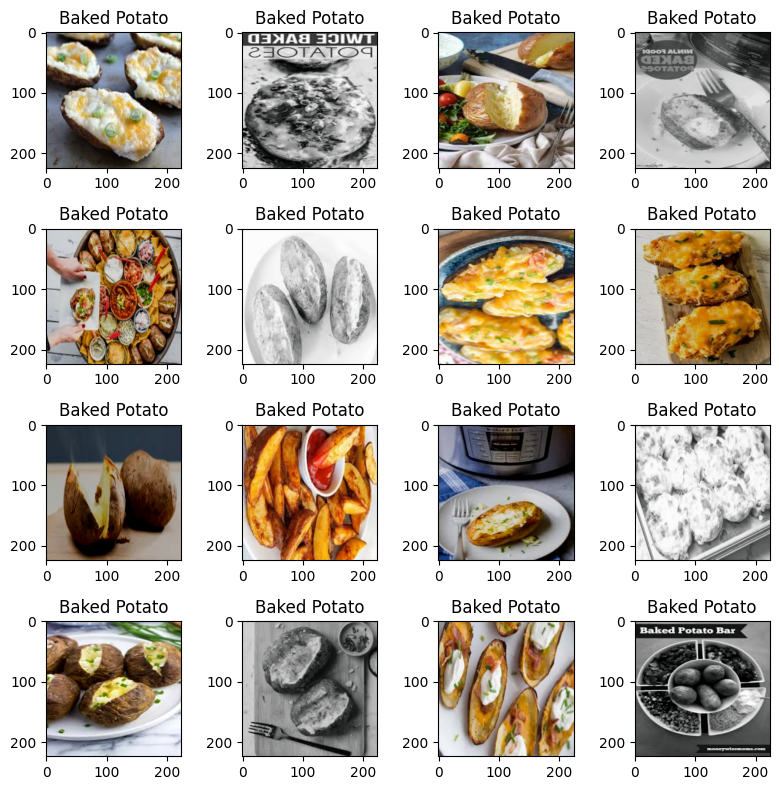

In [ ]:
grid_plot(train_image_folder, 0, 4, 4, size=(8, 8))

The transformations don't seem to alter the images, so they should be able to provide enough variable data to the CNN. <br>
Turning the images to gray should also help focus more on shapes instead of colors, but this is something that may need to be evaluated more in depth to see if it actually brings any benefits.

# Preparing the Model architecture
Given the current task, we'll need to work with a CNN-based model composed of a feature-extraction part and a classification part. <br>
To avoid training the CNN-layers from scratch, we can make use of existing pre-trained models from the torchvision hub, extract the feature layers and use them in our own custom model.

The pre-trained model we'll be using is ResNet 1.52 since, according to the [documentation](https://docs.pytorch.org/vision/main/models/resnet.html), yields a higher accuracy compared to the original model from the paper. <br><br>
Let's briefly analyze how this model is structured:

In [ ]:
pretrained_model = resnet152(weights=ResNet152_Weights.IMAGENET1K_V2)
print(pretrained_model)

# Delete this instance as it's only for inspecting its internals
# and not to use it later. Saves us some memory
free_model_memory(pretrained_model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

As can be seen from the output above, ResNet has 4 sequential layers for feature extraction and 1 fully-connected classification layer for the final  output. <br>
One way to reuse this model is by simply overriding the "fc" member with our own desired structure.

In [11]:
def foodnet(num_classes):
    # Pre-trained base model based on ResNet
    model = resnet152(weights=ResNet152_Weights.IMAGENET1K_V2)

    # Freeze all trainable parameters which we don't want to update during
    # training phase
    for param in model.parameters():
        param.requires_grad = False

    # Override classification layer with custom logic
    model.fc = nn.Sequential(
        nn.Linear(model.fc.in_features, 1024),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(1024, 256),
        nn.ReLU(),
        nn.Dropout(0.2),
        nn.Linear(256, num_classes)
    )

    return model

In [ ]:
base_model = foodnet(len(train_image_folder.classes)).to(device)
summary(base_model, (3, 224, 224))

# Delete base_model as it's also not needed after this summary
free_model_memory(base_model)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

Now, out of 60M parameters, only 2.3M are trainable and 58M are frozen (non-trainable).

# Training and fine-tuning
Since we have the model, the challenge now is to fine-tune it for our specific task. Model performances are highly affected by hyper-parameters, so chosing them correctly is a crucial step. <br>
For that, we can try some Cross-Validation techniques and see how the model performs on different configurations.

## Experiment Helpers

In [12]:
class EarlyStopping:
    """
    Early stopping to stop the training when the loss does not improve after
    certain epochs.
    """

    def __init__(self, min_delta = 0.001, patience = 50, checkpoint_path: str = None) -> None:
        """
        Args:
            min_delta (float): Minimum change in the monitored quantity to qualify
            as an improvement, i.e. an absolute change of less than min_delta, will
            count as no improvement.
        """
        self.best_loss = float('inf')
        self.patience_counter = 0
        self.checkpoint_path = checkpoint_path
        self.min_delta = min_delta
        self.patience = patience

    def __call__(self, val_loss, model):
        """
        Called at every iteration to determine if the early-stopping conditions
        are met and if so, save the model if it improved by the minimum threshold.

        Args:
            val_loss (float): The current validation loss.
            model (torch.nn.Module): The model to save.
        """
        if self.best_loss > val_loss and abs(self.best_loss - val_loss) > self.min_delta:
            self.best_loss = val_loss
            self.patience_counter = 0
            self.save_model(model)
        else:
            self.patience_counter += 1

        return self.is_stopped()

    def is_stopped(self):
        """
        Returns True if the early-stopping conditions are met, False otherwise.
        """
        return self.patience_counter >= self.patience

    def save_model(self, model):
        """
        Saves the model to the checkpoint path.

        Args:
            model (torch.nn.Module): The model to save.
        """
        if model is None:
            return
        print(f"Saving model {self.checkpoint_path}...")
        os.makedirs(self.checkpoint_path, exist_ok=True)
        torch.save(model.state_dict(), os.path.join(self.checkpoint_path, "model.pt"))

In [54]:
@dataclass
class Experiment:
    name: str
    model: object
    optimizer: object
    loss_fn: object
    num_classes: int
    batch_size: int = 32
    epoch_count: int = 1000
    lr: float = 0.001
    lr_linear_range: tuple = None,
    momentum: float = 0.9
    weight_decay: float = 0.0
    patience: int = 50
    min_delta: float = 0.001
    random_state: int = 42
    train_loss: list = None
    val_loss: list = None
    train_acc: list = None
    val_acc: list = None
    checkpoint_path: str = "./checkpoints"
    epochs: list = None
    status_update: int = 1
    trainset_loader: DataLoader = None
    valset_loader: DataLoader = None

    def __post_init__(self):
        self.loss_fn = self.loss_fn()
        self.early_stop = EarlyStopping(self.min_delta, self.patience, os.path.join(self.checkpoint_path, self.name))

        self.clear_metrics()

    def init_model(self):
        """
        Initializes the model instance, if not already done.
        """
        if not isinstance(self.model, nn.Module):
            self.model = self.model(self.num_classes).to(device)

    def init_optimizer(self):
        """
        Initializes the optimizer, if not already done.
        """
        if not isinstance(self.optimizer, optim.Optimizer):
            if self.optimizer == optim.SGD:
                self.optimizer = self.optimizer(filter(lambda p: p.requires_grad, self.model.parameters()), lr=self.lr, momentum=self.momentum, weight_decay=self.weight_decay)
            else:
                self.optimizer = self.optimizer(filter(lambda p: p.requires_grad, self.model.parameters()), lr=self.lr, weight_decay=self.weight_decay)

    def clear_metrics(self):
        self.epochs = []
        self.train_loss = []
        self.val_loss = []
        self.train_acc = []
        self.val_acc = []

    def plot_loss(self):
        plt.plot(self.epochs, self.train_loss, label=f"Train Loss - {self.name}", linestyle = '--')
        plt.plot(self.epochs, self.val_loss, label=f"Val Loss - {self.name}")

    def plot_accuracy(self):
        plt.plot(self.epochs, self.train_acc, label=f"Train Accuracy - {self.name}", linestyle = '--')
        plt.plot(self.epochs, self.val_acc, label=f"Val Accuracy - {self.name}")

    def save_model(self):
        """
        Saves the current model at the defined checkpoint path.
        """
        os.makedirs(self.checkpoint_path, exist_ok=True)
        torch.save(self.model.state_dict(), os.path.join(self.checkpoint_path, "model.pt"))

    def load_model(self, model_path = None):
        """
        Loads a model from the provided path or, if not set, defaults to
        the defined checkpoint path.
        """
        if model_path is None:
            model_path = os.path.join(self.checkpoint_path, "model.pt")

        self.init_model()
        self.init_optimizer()
        self.model.load_state_dict(torch.load(model_path))

    def unload_model(self):
        """
        Unloads and deletes the model and optimizer from memory.
        Frees up all occupied memory by both instances.
        """
        import gc

        if self.model is not None:
            del self.model
            self.model = None

        if self.optimizer is not None:
            del self.optimizer
            self.optimizer = None

        gc.collect()
        torch.cuda.empty_cache()
        torch.cuda.ipc_collect()

In [55]:
@dataclass
class CrossValidatedExperiment(Experiment):
    trainset: ImageFolder = None
    valset: ImageFolder = None
    kfold: int = 3
    shuffle: bool = True

    def __post_init__(self):
        self.fold_experiments = []

        kf = KFold(n_splits=self.kfold, shuffle=self.shuffle, random_state=self.random_state)

        for fold, (train_index, val_index) in enumerate(kf.split(self.trainset)):
            self.fold_experiments.append(
                Experiment(
                    name = f"{self.name} - Fold {fold+1}",
                    model = self.model,
                    optimizer = self.optimizer,
                    loss_fn = self.loss_fn,
                    num_classes = self.num_classes,
                    batch_size = self.batch_size,
                    epoch_count = self.epoch_count,
                    lr = self.lr,
                    lr_linear_range = self.lr_linear_range,
                    momentum = self.momentum,
                    weight_decay = self.weight_decay,
                    patience = self.patience,
                    min_delta = self.min_delta,
                    checkpoint_path = os.path.join(self.checkpoint_path, f"{fold+1}"),
                    random_state = self.random_state,
                    trainset_loader = DataLoader(self.trainset, batch_size=self.batch_size, sampler=SubsetRandomSampler(train_index)),
                    valset_loader = DataLoader(self.valset, batch_size=self.batch_size)
                )
            )

    def train_all(self, device, unload_after_train = True):
        for fold_exp in self.fold_experiments:
            train_experiment(fold_exp, device)

            if unload_after_train:
                fold_exp.unload_model()

    def plot_loss(self):
        for fold_exp in self.fold_experiments:
            fold_exp.plot_loss()

    def plot_accuracy(self):
        for fold_exp in self.fold_experiments:
            fold_exp.plot_accuracy()

In [56]:
def train_experiment(exp: Experiment, device: torch.device):
    """
    Trains a model for a given experiment.

    Args:
        exp (Experiment): The experiment to train.
        device (torch.device): The device to use for training.
    """
    print(f"Training {exp.name}...")

    # Initialize model and optimizer first, if not already done
    exp.init_model()
    exp.init_optimizer()

    # Set model into training state
    exp.model.train()

    # Define a Learning Rate scheduler, if specified in the experiment settings
    # TODO: Definition could be embedded into the experiment class
    lr_scheduler = None
    if exp.lr_linear_range is not None:
        lr_scheduler = optim.lr_scheduler.LinearLR(exp.optimizer, start_factor=exp.lr_linear_range[0], end_factor=exp.lr_linear_range[1], total_iters=exp.epoch_count)

    # Training process should start clean
    exp.clear_metrics()

    best_loss = float('inf')
    patience_counter = 0 # Used for early stopping

    for epoch in range(exp.epoch_count):
        train_loss = 0.0
        train_acc = 0.0

        total_samples = 0

        for i, (X_train, y_train) in enumerate(exp.trainset_loader, 0):
            # Move samples to device (cpu or cuda)
            X_train, y_train = X_train.to(device), y_train.to(device)

            # Predict samples with current parameters
            y_pred = exp.model(X_train)
            # Calculate loss between actual and predicted targets
            loss = exp.loss_fn(y_pred, y_train)
            # Accumulate loss amount
            train_loss += loss

            # Keep track of how many samples we're processing
            total_samples += len(X_train)

            # Calculate accuracy
            _, predicted = torch.max(y_pred.data, 1)
            train_acc += (predicted == y_train).sum().item()

            # Reset gradients
            exp.model.zero_grad()

            # Calculate gradient
            loss.backward()

            # Optimize next step
            exp.optimizer.step()

        # Calculate actual percentages for loss and accuracy
        train_loss = train_loss.cpu().detach().numpy() / total_samples
        train_acc = train_acc / total_samples

        # Store metrics
        exp.epochs.append(epoch)
        exp.train_loss.append(train_loss)
        exp.train_acc.append(train_acc)

        val_loss, val_acc = eval_experiment(exp, exp.valset_loader, device, True)

        current_lr = exp.optimizer.param_groups[0]["lr"]
        if lr_scheduler is not None:
            # LR Scheduler's step() method needs to be called after each epoch
            lr_scheduler.step()

        if epoch % exp.status_update == 0:
            print(f"Epoch {epoch+1}/{exp.epoch_count} - Train Loss: {train_loss:.4f} - Val Loss: {val_loss:.4f} - Train Accuracy: {train_acc:.4f} - Val Accuracy: {val_acc:.4f} - LR: {current_lr:.8f}")

        if exp.early_stop(val_loss, exp.model):
            print("Early stopping triggered...")
            return

In [57]:
def eval_experiment(exp: Experiment, dataset_loader: DataLoader, device: torch.device, is_training = False):
    """
    Evaluates a model for a given experiment.

    Args:
        exp (Experiment): The experiment to evaluate.
        dataset_loader (DataLoader): The dataset loader to use for evaluation.
        device (torch.device): The device to use for evaluation.
        is_training (bool, optional): Whether the evaluation is during training. Defaults to False.

    Returns:
        tuple: A tuple containing the validation loss and accuracy if is_training = True, else a tuple containing the predictions and targets.
    """
    exp.init_model()
    exp.model.eval()

    # Tell pytorch to not calculate gradients during evaluation
    with torch.no_grad():
        val_loss = 0.0
        val_acc = 0.0
        total_samples = 0
        predictions = []
        targets = []

        for i, (X, y) in enumerate(dataset_loader, 0):
            # Move samples to device
            X, y = X.to(device), y.to(device)

            # Classify samples
            y_pred = exp.model(X)
            loss = exp.loss_fn(y_pred, y)
            val_loss += loss

            total_samples += len(X)

            # Calculate accuracy
            _, predicted = torch.max(y_pred.data, 1)
            val_acc += (predicted == y).sum().item()

            if not is_training:
                # Store predictions if in evaluation mode
                predictions.extend(predicted.cpu().numpy())
                targets.extend(y.cpu().numpy())

        # Calculate metric percentages
        val_loss = val_loss.cpu().detach().numpy() / len(dataset_loader)
        val_acc = val_acc / total_samples

        if is_training:
            # Store metrics if in training mode
            exp.val_loss.append(val_loss)
            exp.val_acc.append(val_acc)

            return val_loss, val_acc

        print(f"Accuracy: {val_acc:.4f}")
        return predictions, targets

In [17]:
def plot_experiment_metrics(experiments: list):
    """
    Plots the metrics of a list of experiments.

    Args:
        experiments (list): The list of experiments to plot.
    """
    rows = len(experiments)
    cols = 2

    plt.figure(figsize=(4*(rows*2), 4*rows))
    for i in range(rows * cols):
        plt.subplot(rows, cols, i + 1)
        plt.xlabel("Epochs")

        exp = experiments[i // cols]

        if i % 2 == 0:
            plt.title(f"{exp.name} Loss")
            plt.ylabel("Loss")
            exp.plot_loss()
        else:
            plt.title(f"{exp.name} Accuracy")
            plt.ylabel("Accuracy")
            exp.plot_accuracy()

        plt.legend()

    plt.tight_layout()
    plt.show()

## Setting up experiments

First things first, let's prepare the testset loader:

In [18]:
testset_loader = DataLoader(test_image_folder, batch_size=32, shuffle=False)
testset_loader

In [19]:
num_classes = len(train_image_folder.classes)

### Evaluating the baseline
This will give us an idea where we're starting from and how well we're doing as we train the model when comparing it with the starting point.

In [ ]:
baseline_experiment = Experiment(
    name = "Baseline",
    model = foodnet,
    optimizer = optim.Adam,
    loss_fn = nn.CrossEntropyLoss,
    num_classes = num_classes,
)

eval_experiment(baseline_experiment, testset_loader, device)

baseline_experiment.unload_model()

Accuracy: 0.0711


Accuracy of the baseline model changes randomly at each run and goes anywhere from 0 - 10% (occasionally even higher, but it's random), just as expected, since the classification layer is not trained.

### Cross-Validated Experiments
We'll setup a few different experiments with different configurations and have different instances of the model be trained on them to assess how its performance evolves given a certain set of parameters. <br>
Once this is done, we can pick out the best one, train it properly with the chosen hyper-parameters, and finally evaluate it on the testset to see its overall accuracy.<br>
From there, we can decide if to continue fine-tuning the model or leave it as it is.

In [ ]:
experiments = [
    CrossValidatedExperiment(
        name = "Exp1",
        model = foodnet,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 64,
        epoch_count = 5,
        lr = 0.001,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
    ),
    CrossValidatedExperiment(
        name = "Exp2",
        model = foodnet,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 32,
        epoch_count = 5,
        lr = 0.01,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
    ),
    CrossValidatedExperiment(
        name = "Exp3",
        model = foodnet,
        optimizer = torch.optim.SGD,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        momentum = 0.8,
        batch_size = 32,
        epoch_count = 5,
        lr = 0.002,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
    ),
]

In [ ]:
for exp in experiments:
    exp.train_all(device)

Training Exp1 - Fold 1...
Epoch 1/5 - Train Loss: 0.0228 - Val Loss: 0.8188 - Train Accuracy: 0.5218 - Val Accuracy: 0.7228
Saving model ./checkpoints/1/Exp1 - Fold 1...
Epoch 2/5 - Train Loss: 0.0117 - Val Loss: 0.6428 - Train Accuracy: 0.7554 - Val Accuracy: 0.7924
Saving model ./checkpoints/1/Exp1 - Fold 1...
Epoch 3/5 - Train Loss: 0.0093 - Val Loss: 0.6083 - Train Accuracy: 0.8036 - Val Accuracy: 0.8013
Saving model ./checkpoints/1/Exp1 - Fold 1...
Epoch 4/5 - Train Loss: 0.0082 - Val Loss: 0.6366 - Train Accuracy: 0.8291 - Val Accuracy: 0.7978
Epoch 5/5 - Train Loss: 0.0069 - Val Loss: 0.6167 - Train Accuracy: 0.8562 - Val Accuracy: 0.8143
Early stopping triggered...
Training Exp1 - Fold 2...
Epoch 1/5 - Train Loss: 0.0230 - Val Loss: 0.7222 - Train Accuracy: 0.5195 - Val Accuracy: 0.7705
Saving model ./checkpoints/2/Exp1 - Fold 2...
Epoch 2/5 - Train Loss: 0.0122 - Val Loss: 0.5909 - Train Accuracy: 0.7408 - Val Accuracy: 0.8170
Saving model ./checkpoints/2/Exp1 - Fold 2...
Epoc

Let's visualize the results graphically:

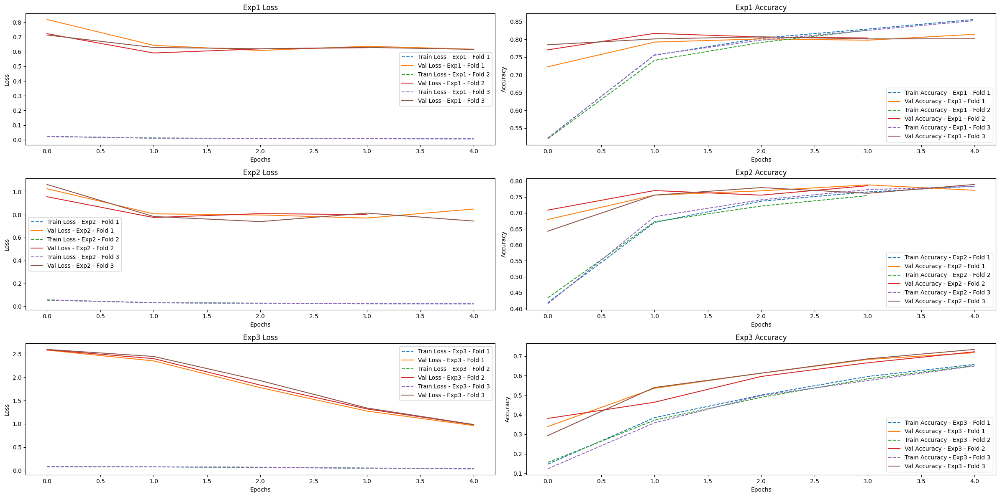

In [ ]:
plot_experiment_metrics(experiments)

The first 2 experiments reach an accuracy of 80%+ but couldn't break through it as can be seen from the plots above. It often bounces back down and back up, but never really breaks the 80-82% mark. <br><br>
Experiment 3 reached only 73% in 5 epochs. <br><br>
One thing to notice, though, is how the loss metric evolved. <br>
Experiment 1 and 2 look very unstable (they stopped decreasing after some time and bounced constantly off the same threshold for the whole time), while experiment 3 steadily decreases, indicating that it might yield better results if we let it run for some more epochs.

# Model training and validation
Let's assemble the model with the chosen hyper-parameters configuration and train it.

In [20]:
trainset_loader = DataLoader(train_image_folder, batch_size=32, shuffle=True)
valset_loader = DataLoader(val_image_folder, batch_size=32, shuffle=False)

In [ ]:
final_experiment = Experiment(
    name = "Final Model",
    model = foodnet,
    optimizer = optim.SGD,
    loss_fn = nn.CrossEntropyLoss,
    num_classes = num_classes,
    momentum = 0.8,
    batch_size = 32,
    epoch_count = 50,
    lr = 0.001,
    patience = 3,
    min_delta = 0.001,
    trainset_loader = trainset_loader,
    valset_loader = valset_loader,
)

In [ ]:
train_experiment(final_experiment, device)

Training Final Model...
Epoch 1/50 - Train Loss: 0.0823 - Val Loss: 2.6240 - Train Accuracy: 0.0900 - Val Accuracy: 0.1241
Saving model ./checkpoints/Final Model...
Epoch 2/50 - Train Loss: 0.0818 - Val Loss: 2.6038 - Train Accuracy: 0.1555 - Val Accuracy: 0.2348
Saving model ./checkpoints/Final Model...
Epoch 3/50 - Train Loss: 0.0812 - Val Loss: 2.5736 - Train Accuracy: 0.2840 - Val Accuracy: 0.4295
Saving model ./checkpoints/Final Model...
Epoch 4/50 - Train Loss: 0.0801 - Val Loss: 2.5257 - Train Accuracy: 0.4134 - Val Accuracy: 0.5353
Saving model ./checkpoints/Final Model...
Epoch 5/50 - Train Loss: 0.0784 - Val Loss: 2.4421 - Train Accuracy: 0.4890 - Val Accuracy: 0.5853
Saving model ./checkpoints/Final Model...
Epoch 6/50 - Train Loss: 0.0753 - Val Loss: 2.2964 - Train Accuracy: 0.5309 - Val Accuracy: 0.5714
Saving model ./checkpoints/Final Model...
Epoch 7/50 - Train Loss: 0.0701 - Val Loss: 2.0690 - Train Accuracy: 0.5439 - Val Accuracy: 0.5884
Saving model ./checkpoints/Fina

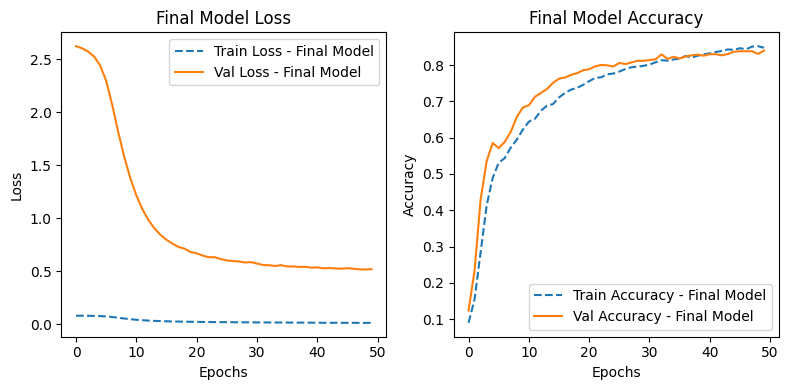

In [ ]:
plot_experiment_metrics([final_experiment])

In [ ]:
predictions, targets = eval_experiment(final_experiment, testset_loader, device)

Accuracy: 0.8254


As it appears from the plots above, the outcome was identical even with SGD. <br>
The network stabilized at around 83% accuracy with a loss hitting close to the 0.5, just like with the tests where Adam was used. <br>
This means that SGD not only was much slower than Adam, but it actually didn't yield the results we were hoping for. <br><br>
Perhaps inspecting the incorrect classifications might give us some clue where the network is struggling.

Text(50.58159722222221, 0.5, 'Actual')

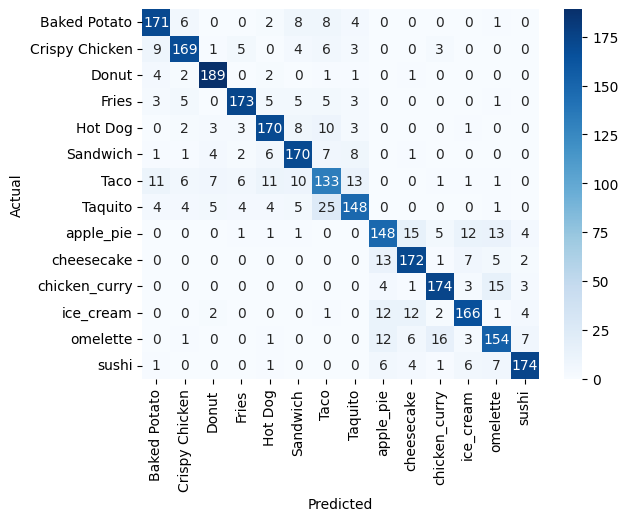

In [ ]:
plot_confusion_matrix(targets, predictions, train_image_folder.classes)

There are quite a few classes that are being misclassified: Taco, Taquito, Apple Pie, Cheesecake, etc. <br>

Let's check the actual images.

In [ ]:
targets = np.array(targets)
predictions = np.array(predictions)

print("Misclassified samples: %d / %d" % ((targets != predictions).sum(), len(targets)))

Misclassified samples: 489 / 2800


In [73]:
class MaskedSampler(torch.utils.data.Sampler):
    """
    Custom sampler to navigate over a dataset based on a mask.
    """

    def __init__(self, dataset, mask):
        self.dataset = dataset
        self.mask = mask

    def __iter__(self):
        return iter(np.where(self.mask)[0])

    def __len__(self):
        return len(self.dataset)

# Define a masked dataloader for the testset so that we can iterate over the misclassified samples
masked_testset_loader = DataLoader(test_image_folder, shuffle=False, sampler=MaskedSampler(test_image_folder, targets != predictions))
masked_testset_loader

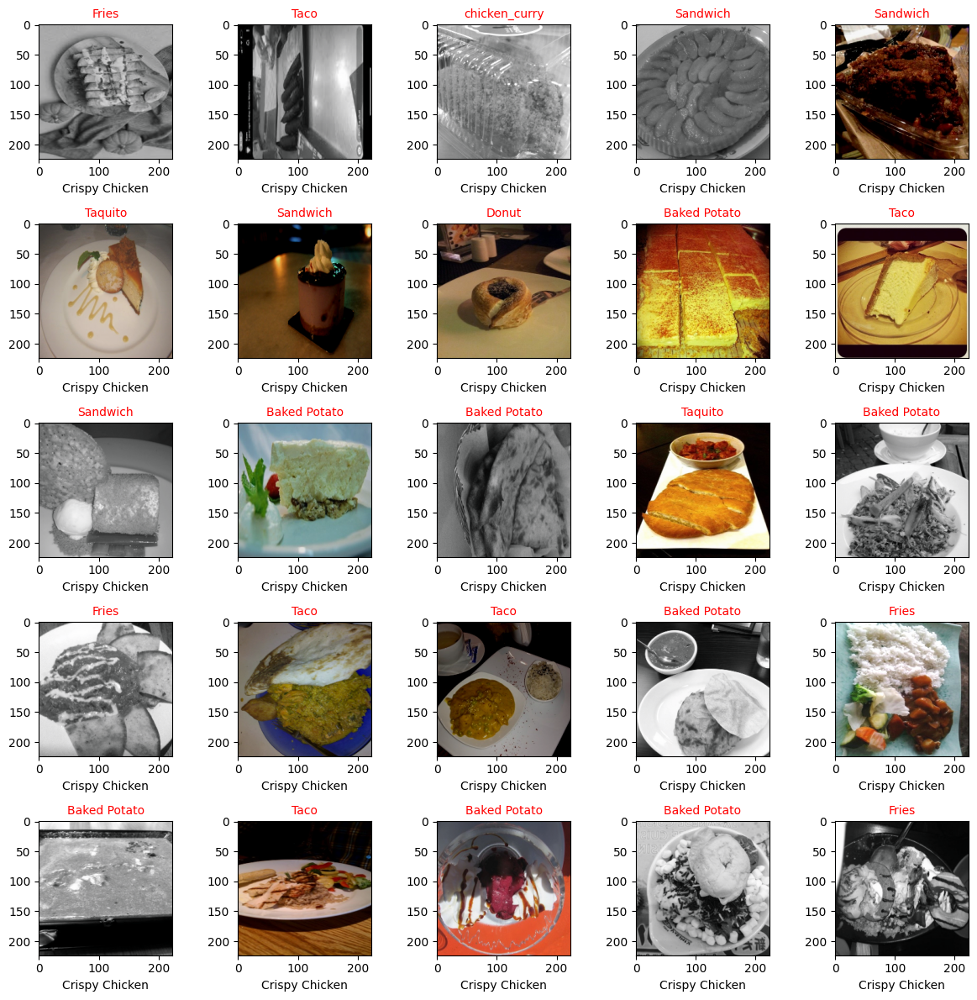

In [ ]:
# Apply transformations used for the training set to see if it eventually disrupts
# the actual images and makes it harder to recognize
test_image_folder.transform = AlbumMediator(train_transforms)

# Plot some misclassified samples
grid_plot_dataloader(masked_testset_loader, targets, predictions, test_image_folder.classes, show_false_only=True, start_index=250)

# And set back the basic transforms for the testset
test_image_folder.transform = AlbumMediator(basic_transforms)

From the plot above, we can see what the model actually misclassified. However, going through the testset, there are many samples that should not be difficult to classify correctly. The transformations applied to the images do not really disrupt the features it contains, except for the grayscale color, which actually removes color features which the network could even use to better understand what it's looking at. <br>
In fact, even for a human it might be difficult to understand some of the images above if it was not for the colors. <br><br>
Let's try to change the augmentation strategy and retry the training and validation.

In [21]:
train_transforms = A.Compose([
    A.Sharpen(alpha=(0.2, 0.4), lightness=(0.5, 1.0), p=0.5),
    A.Resize(224, 224),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.4),
    A.RandomRotate90(p=0.3),
    A.CoarseDropout(
      num_holes_range=(4, 16),
      hole_height_range=(16, 32),
      hole_width_range=(16, 32),
      fill=0.0,
      p=1.0
    ),
    A.Normalize(mean=image_mean, std=image_std),
    ToTensorV2()
])

train_image_folder.transform = AlbumMediator(train_transforms)
test_image_folder.transform = AlbumMediator(basic_transforms)
val_image_folder.transform = AlbumMediator(basic_transforms)

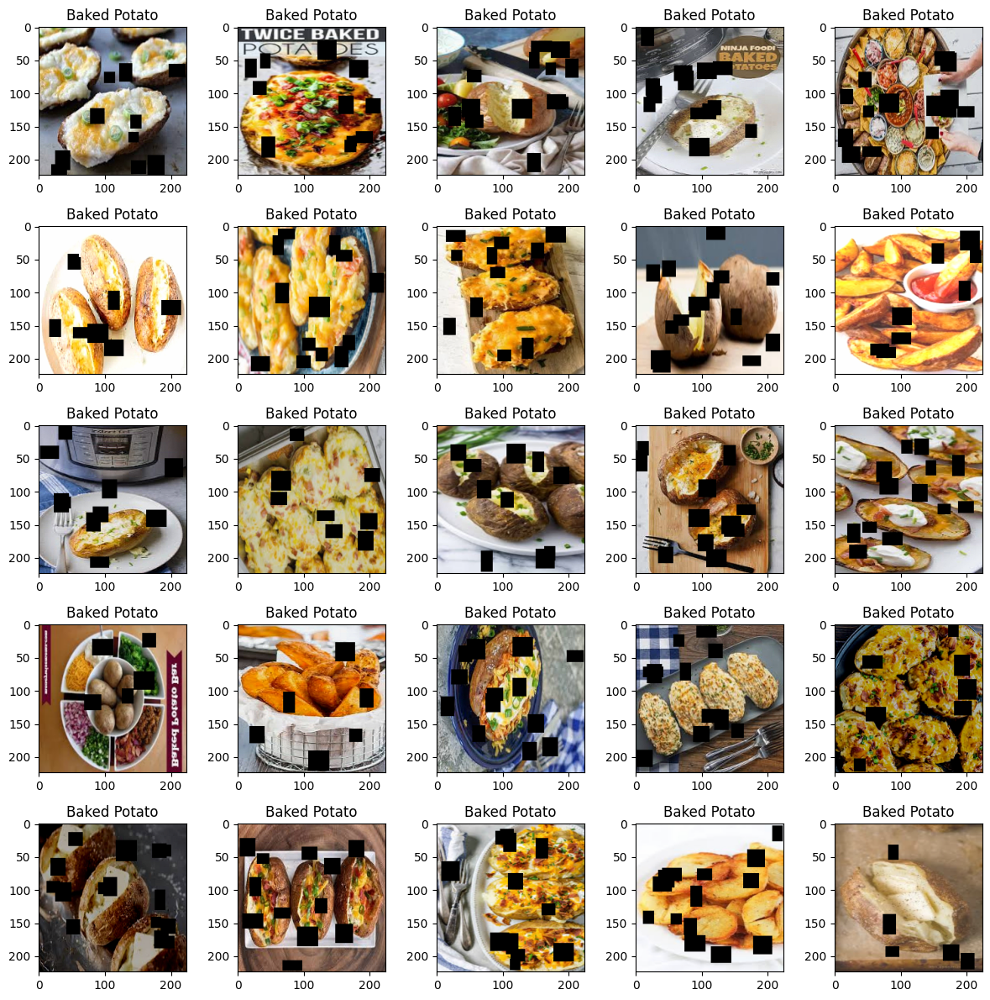

In [ ]:
grid_plot(train_image_folder)

Let's now define a new experiment to see how this will perform.

In [23]:
trainset_loader = DataLoader(train_image_folder, batch_size=32, shuffle=True)

In [ ]:
final_experiment2 = Experiment(
    name = "Final Model 2",
    model = foodnet,
    optimizer = optim.Adam,
    loss_fn = nn.CrossEntropyLoss,
    num_classes = num_classes,
    batch_size = 32,
    epoch_count = 50,
    lr = 0.001,
    patience = 5,
    min_delta = 0.001,
    trainset_loader = trainset_loader,
    valset_loader = valset_loader,
)

In [ ]:
train_experiment(final_experiment2, device)

Training Final Model 2...
Epoch 1/50 - Train Loss: 0.0341 - Val Loss: 0.6167 - Train Accuracy: 0.6496 - Val Accuracy: 0.8054
Saving model ./checkpoints/Final Model 2...
Epoch 2/50 - Train Loss: 0.0177 - Val Loss: 0.5433 - Train Accuracy: 0.8137 - Val Accuracy: 0.8174
Saving model ./checkpoints/Final Model 2...
Epoch 3/50 - Train Loss: 0.0138 - Val Loss: 0.5300 - Train Accuracy: 0.8536 - Val Accuracy: 0.8290
Saving model ./checkpoints/Final Model 2...
Epoch 4/50 - Train Loss: 0.0116 - Val Loss: 0.5520 - Train Accuracy: 0.8734 - Val Accuracy: 0.8205
Epoch 5/50 - Train Loss: 0.0105 - Val Loss: 0.5266 - Train Accuracy: 0.8820 - Val Accuracy: 0.8362
Saving model ./checkpoints/Final Model 2...
Epoch 6/50 - Train Loss: 0.0093 - Val Loss: 0.5674 - Train Accuracy: 0.9007 - Val Accuracy: 0.8183
Epoch 7/50 - Train Loss: 0.0083 - Val Loss: 0.5988 - Train Accuracy: 0.9112 - Val Accuracy: 0.8362
Epoch 8/50 - Train Loss: 0.0072 - Val Loss: 0.6330 - Train Accuracy: 0.9220 - Val Accuracy: 0.8317
Epoch 

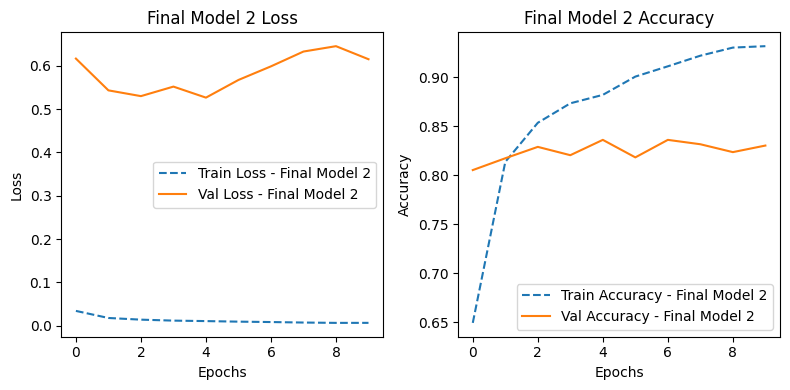

In [ ]:
plot_experiment_metrics([final_experiment2])

In [ ]:
final_experiment2.unload_model()

Evidently the model is overfitting here. The training accuracy broke the 93% mark while the validation accuracy only managed 83%. <br>
Perhaps the model architecture is not well defined and needs some tweaking. <br>

Let's define a new architecture:

In [22]:
def foodnet2(num_classes):
    # Pre-trained base model based on ResNet
    model = resnet152(weights=ResNet152_Weights.IMAGENET1K_V2)

    # Freeze all trainable parameters which we don't want to update during
    # training phase
    for param in model.parameters():
        param.requires_grad = False

    # Override classification layer with custom logic
    model.fc = nn.Sequential(
        nn.Linear(model.fc.in_features, 256), # Was 2048 -> 1024
        nn.ReLU(),
        nn.Dropout(0.4), # Was 0.2
        nn.Linear(256, 128), # Was 1024 -> 256
        nn.ReLU(),
        nn.Dropout(0.3), # Was 0.2
        nn.Linear(128, num_classes) # Was 256 -> num_classes
    )

    return model

def foodnet3(num_classes):
    # Pre-trained base model based on ResNet
    model = resnet152(weights=ResNet152_Weights.IMAGENET1K_V2)

    # Freeze all trainable parameters of the pretrained model
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze last bottleneck block
    for param in model.layer4[-1:].parameters():
        param.requires_grad = True

    # Override classification layer with custom logic
    model.fc = nn.Sequential(
        nn.Linear(model.fc.in_features, 256),
        nn.ReLU(),
        nn.Dropout(0.33),
        nn.Linear(256, num_classes),
    )

    return model

In [ ]:
free_model_memory()

experiments = [
    CrossValidatedExperiment(
        name = "Exp1",
        model = foodnet2,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 64,
        epoch_count = 5,
        lr = 0.001,
        lr_linear_range = (1.0, 0.5),
        weight_decay = 0.0001,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp2",
        model = foodnet3,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 128,
        epoch_count = 5,
        lr = 0.01,
        lr_linear_range = (1.0, 0.5),
        weight_decay = 0.00004,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp3",
        model = foodnet2,
        optimizer = torch.optim.SGD,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        momentum = 0.9,
        batch_size = 64,
        epoch_count = 5,
        lr = 0.002,
        lr_linear_range = (1.0, 0.3),
        weight_decay = 0.00001,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp4",
        model = foodnet3,
        optimizer = torch.optim.SGD,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        momentum = 0.85,
        batch_size = 128,
        epoch_count = 5,
        lr = 0.0015,
        lr_linear_range = (1.0, 0.5),
        weight_decay = 0.000004,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
]

In [ ]:
for exp in experiments:
    exp.train_all(device)

Training Exp1 - Fold 1...
Epoch 1/5 - Train Loss: 0.0301 - Val Loss: 1.1118 - Train Accuracy: 0.3770 - Val Accuracy: 0.7129 - LR: 0.00100000
Saving model ./checkpoints/1/Exp1 - Fold 1...
Epoch 2/5 - Train Loss: 0.0127 - Val Loss: 0.6703 - Train Accuracy: 0.7393 - Val Accuracy: 0.7920 - LR: 0.00090000
Saving model ./checkpoints/1/Exp1 - Fold 1...
Epoch 3/5 - Train Loss: 0.0091 - Val Loss: 0.6563 - Train Accuracy: 0.8121 - Val Accuracy: 0.7808 - LR: 0.00080000
Saving model ./checkpoints/1/Exp1 - Fold 1...
Epoch 4/5 - Train Loss: 0.0076 - Val Loss: 0.5605 - Train Accuracy: 0.8442 - Val Accuracy: 0.8223 - LR: 0.00070000
Saving model ./checkpoints/1/Exp1 - Fold 1...
Epoch 5/5 - Train Loss: 0.0068 - Val Loss: 0.5551 - Train Accuracy: 0.8618 - Val Accuracy: 0.8183 - LR: 0.00060000
Saving model ./checkpoints/1/Exp1 - Fold 1...
Training Exp1 - Fold 2...
Epoch 1/5 - Train Loss: 0.0300 - Val Loss: 1.0832 - Train Accuracy: 0.3853 - Val Accuracy: 0.7054 - LR: 0.00100000
Saving model ./checkpoints/2

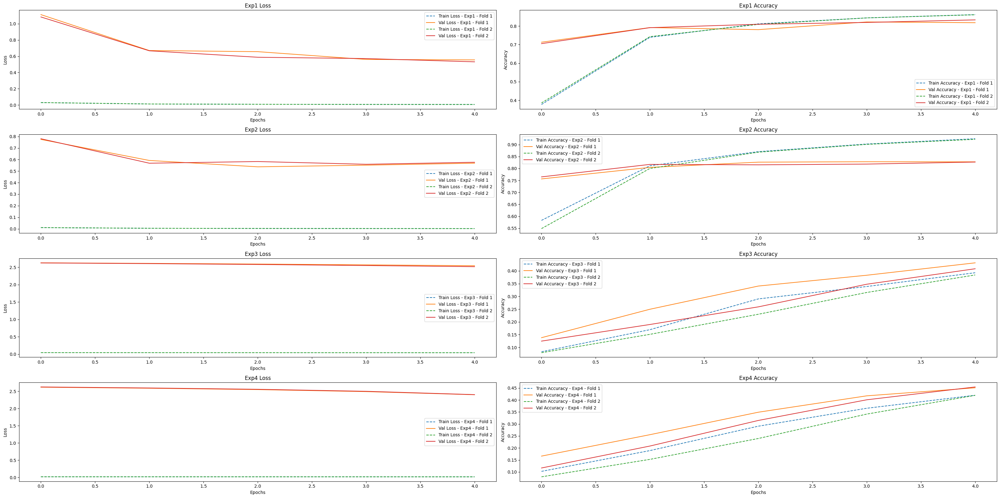

In [ ]:
plot_experiment_metrics(experiments)

Clearly, SGD is not the way to go for this task. Let's define a couple more experiments with different parameters and compare Adam against RMSProp.

In [ ]:
torch.cuda.empty_cache()

experiments2 = [
    CrossValidatedExperiment(
        name = "Exp5",
        model = foodnet2,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 5,
        lr = 0.001,
        lr_linear_range = (1.0, 0.5),
        weight_decay = 0.0001,
        patience = 3,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp6",
        model = foodnet2,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 5,
        lr = 0.01,
        lr_linear_range = (1.0, 0.5),
        weight_decay = 0.00001,
        patience = 3,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp7",
        model = foodnet2,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 5,
        lr = 0.001,
        lr_linear_range = (1.0, 0.3),
        weight_decay = 0.001,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp8",
        model = foodnet2,
        optimizer = torch.optim.RMSprop,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 32,
        epoch_count = 5,
        lr = 0.002,
        lr_linear_range = (1.0, 0.5),
        weight_decay = 0.0004,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp9",
        model = foodnet2,
        optimizer = torch.optim.RMSprop,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 128,
        epoch_count = 5,
        lr = 0.0015,
        lr_linear_range = (1.0, 0.5),
        weight_decay = 0.0004,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp10",
        model = foodnet2,
        optimizer = torch.optim.SGD,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 64,
        epoch_count = 5,
        lr = 0.0015,
        lr_linear_range = (1.0, 0.75),
        weight_decay = 0.01,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
]

In [ ]:
for exp in experiments2:
    exp.train_all(device)

Training Exp5 - Fold 1...
Epoch 1/5 - Train Loss: 0.1076 - Val Loss: 0.9058 - Train Accuracy: 0.4292 - Val Accuracy: 0.7357 - LR: 0.00100000
Saving model ./checkpoints/1/Exp5 - Fold 1...
Epoch 2/5 - Train Loss: 0.0470 - Val Loss: 0.6590 - Train Accuracy: 0.7592 - Val Accuracy: 0.7942 - LR: 0.00090000
Saving model ./checkpoints/1/Exp5 - Fold 1...
Epoch 3/5 - Train Loss: 0.0347 - Val Loss: 0.6163 - Train Accuracy: 0.8221 - Val Accuracy: 0.7964 - LR: 0.00080000
Saving model ./checkpoints/1/Exp5 - Fold 1...
Epoch 4/5 - Train Loss: 0.0284 - Val Loss: 0.5664 - Train Accuracy: 0.8511 - Val Accuracy: 0.8156 - LR: 0.00070000
Saving model ./checkpoints/1/Exp5 - Fold 1...
Epoch 5/5 - Train Loss: 0.0238 - Val Loss: 0.5531 - Train Accuracy: 0.8708 - Val Accuracy: 0.8281 - LR: 0.00060000
Saving model ./checkpoints/1/Exp5 - Fold 1...
Training Exp5 - Fold 2...
Epoch 1/5 - Train Loss: 0.1078 - Val Loss: 0.9119 - Train Accuracy: 0.4330 - Val Accuracy: 0.7446 - LR: 0.00100000
Saving model ./checkpoints/2

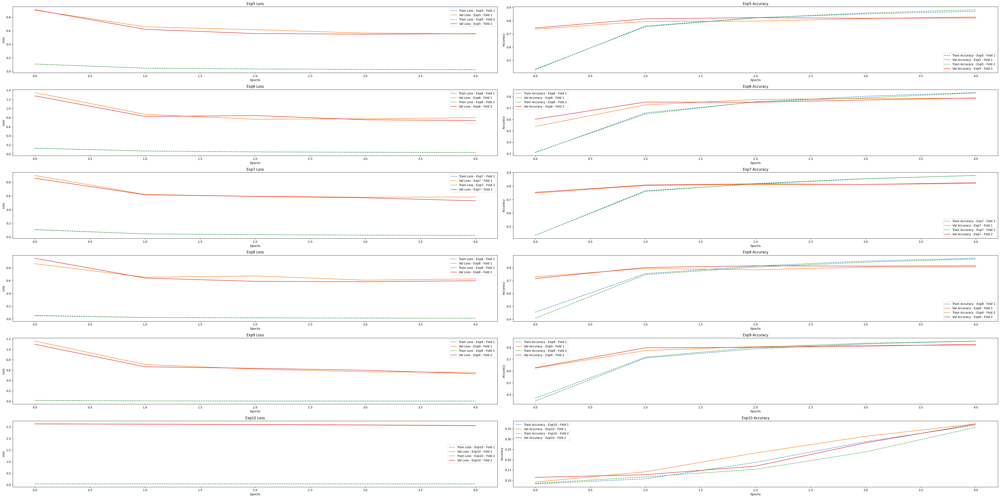

In [ ]:
plot_experiment_metrics(experiments2)

N.B.: The last row shows SGD which I forgot to replace with RMSProp. We can safely discard that one from the comparison and focus on the other ones.

In [ ]:
# N.B.: Results shown below are semi-incorrect: The Val Loss does not match the Val Acc
# It's showing the max Val Loss and max Val Acc instead of the corresponding Val Acc at the lowest Val Loss
print_experiment_results(experiments2)

Experiment comparison based on validation:
Exp5) Val Loss: 0.9119 - Val Acc: 0.8281
Exp6) Val Loss: 1.3474 - Val Acc: 0.7879
Exp7) Val Loss: 0.9006 - Val Acc: 0.8259
Exp8) Val Loss: 0.9504 - Val Acc: 0.8152
Exp9) Val Loss: 1.1594 - Val Acc: 0.8272
Exp10) Val Loss: 2.6308 - Val Acc: 0.3737


From these numbers we can conclude that the parameters from Exp5 and Exp7 did best overall (looking at its loss metric). Their accuracy is very similar, even compared with the accuracy of Exp9 that is slightly higher, but its loss is also much higher. <br>

Let's try some different architectures with the parameters from the 2 chosen experiments to see if we can gain some more performance out of it.

N.B.: Due to hardware restrictions, I'll need to split the experiments into different chunks.

In [23]:
# foodnet4 will be identical to foodnet3, except for having 2
# bottleneck blocks unfrozen instead of just 1
def foodnet4(num_classes):
    # Pre-trained base model based on ResNet
    model = resnet152(weights=ResNet152_Weights.IMAGENET1K_V2)

    # Freeze all trainable parameters of the pretrained model
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze last bottleneck block
    for param in model.layer4[-2:].parameters():
        param.requires_grad = True

    # Override classification layer with custom logic
    model.fc = nn.Sequential(
        nn.Linear(model.fc.in_features, 256),
        nn.ReLU(),
        nn.Dropout(0.33),
        nn.Linear(256, num_classes),
    )

    return model

# Same as foodnet4, but classification layer is simplified
def foodnet5(num_classes):
    # Pre-trained base model based on ResNet
    model = resnet152(weights=ResNet152_Weights.IMAGENET1K_V2)

    # Freeze all trainable parameters of the pretrained model
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze last bottleneck block
    for param in model.layer4[-2:].parameters():
        param.requires_grad = True

    # Override classification layer with custom logic
    model.fc =  nn.Linear(model.fc.in_features, num_classes)

    return model

# All feature-extraction layers frozen and simplified classification layer
def foodnet6(num_classes):
    # Pre-trained base model based on ResNet
    model = resnet152(weights=ResNet152_Weights.IMAGENET1K_V2)

    # Freeze all trainable parameters of the pretrained model
    for param in model.parameters():
        param.requires_grad = False

    # Override classification layer with custom logic
    model.fc =  nn.Linear(model.fc.in_features, num_classes)

    return model

In [ ]:
free_model_memory()

experiments3 = [
    CrossValidatedExperiment(
        name = "Exp5 foodnet4",
        model = foodnet4,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 5,
        lr = 0.001,
        lr_linear_range = (1.0, 0.5),
        weight_decay = 0.0001,
        patience = 3,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp5 foodnet5",
        model = foodnet5,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 5,
        lr = 0.001,
        lr_linear_range = (1.0, 0.5),
        weight_decay = 0.0001,
        patience = 3,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp5 foodnet6",
        model = foodnet6,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 5,
        lr = 0.001,
        lr_linear_range = (1.0, 0.5),
        weight_decay = 0.0001,
        patience = 3,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
]

In [ ]:
for exp in experiments3:
    exp.train_all(device)

Training Exp5 foodnet4 - Fold 1...
Epoch 1/5 - Train Loss: 0.0773 - Val Loss: 0.8258 - Train Accuracy: 0.6116 - Val Accuracy: 0.7625 - LR: 0.00100000
Saving model ./checkpoints/1/Exp5 foodnet4 - Fold 1...
Epoch 2/5 - Train Loss: 0.0386 - Val Loss: 0.5361 - Train Accuracy: 0.8004 - Val Accuracy: 0.8272 - LR: 0.00090000
Saving model ./checkpoints/1/Exp5 foodnet4 - Fold 1...
Epoch 3/5 - Train Loss: 0.0262 - Val Loss: 0.4722 - Train Accuracy: 0.8681 - Val Accuracy: 0.8518 - LR: 0.00080000
Saving model ./checkpoints/1/Exp5 foodnet4 - Fold 1...
Epoch 4/5 - Train Loss: 0.0190 - Val Loss: 0.4827 - Train Accuracy: 0.9007 - Val Accuracy: 0.8469 - LR: 0.00070000
Epoch 5/5 - Train Loss: 0.0146 - Val Loss: 0.4097 - Train Accuracy: 0.9241 - Val Accuracy: 0.8670 - LR: 0.00060000
Saving model ./checkpoints/1/Exp5 foodnet4 - Fold 1...
Training Exp5 foodnet4 - Fold 2...
Epoch 1/5 - Train Loss: 0.0784 - Val Loss: 0.6054 - Train Accuracy: 0.6029 - Val Accuracy: 0.8228 - LR: 0.00100000
Saving model ./check

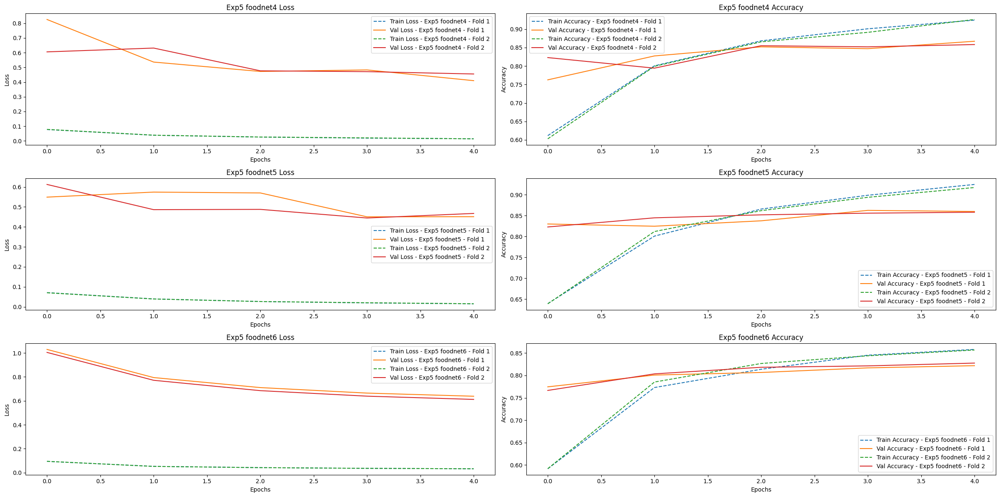

In [ ]:
plot_experiment_metrics(experiments3)

In [ ]:
# N.B.: Results shown below are semi-incorrect: The Val Loss does not match the Val Acc
# It's showing the max Val Loss and max Val Acc instead of the corresponding Val Acc at the lowest Val Loss
print_experiment_results(experiments3)

Experiment comparison based on validation:
Exp5 foodnet4) Val Loss: 0.8258 - Val Acc: 0.8670
Exp5 foodnet5) Val Loss: 0.6124 - Val Acc: 0.8625
Exp5 foodnet6) Val Loss: 1.0295 - Val Acc: 0.8277


In [ ]:
free_model_memory()

experiments4 = [
    CrossValidatedExperiment(
        name = "Exp7 foodnet4",
        model = foodnet4,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 5,
        lr = 0.001,
        lr_linear_range = (1.0, 0.3),
        weight_decay = 0.001,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp7 foodnet5",
        model = foodnet5,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 5,
        lr = 0.001,
        lr_linear_range = (1.0, 0.3),
        weight_decay = 0.001,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
    CrossValidatedExperiment(
        name = "Exp7 foodnet6",
        model = foodnet6,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 5,
        lr = 0.001,
        lr_linear_range = (1.0, 0.3),
        weight_decay = 0.001,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
]

In [ ]:
for exp in experiments4:
    exp.train_all(device)

Training Exp7 foodnet4 - Fold 1...
Epoch 1/5 - Train Loss: 0.0798 - Val Loss: 0.7297 - Train Accuracy: 0.5964 - Val Accuracy: 0.7705 - LR: 0.00100000
Saving model ./checkpoints/1/Exp7 foodnet4 - Fold 1...
Epoch 2/5 - Train Loss: 0.0402 - Val Loss: 0.5671 - Train Accuracy: 0.7964 - Val Accuracy: 0.8272 - LR: 0.00086000
Saving model ./checkpoints/1/Exp7 foodnet4 - Fold 1...
Epoch 3/5 - Train Loss: 0.0286 - Val Loss: 0.5055 - Train Accuracy: 0.8493 - Val Accuracy: 0.8335 - LR: 0.00072000
Saving model ./checkpoints/1/Exp7 foodnet4 - Fold 1...
Epoch 4/5 - Train Loss: 0.0212 - Val Loss: 0.4660 - Train Accuracy: 0.8915 - Val Accuracy: 0.8473 - LR: 0.00058000
Saving model ./checkpoints/1/Exp7 foodnet4 - Fold 1...
Epoch 5/5 - Train Loss: 0.0169 - Val Loss: 0.4690 - Train Accuracy: 0.9123 - Val Accuracy: 0.8446 - LR: 0.00044000
Training Exp7 foodnet4 - Fold 2...
Epoch 1/5 - Train Loss: 0.0790 - Val Loss: 0.6968 - Train Accuracy: 0.6060 - Val Accuracy: 0.8022 - LR: 0.00100000
Saving model ./check

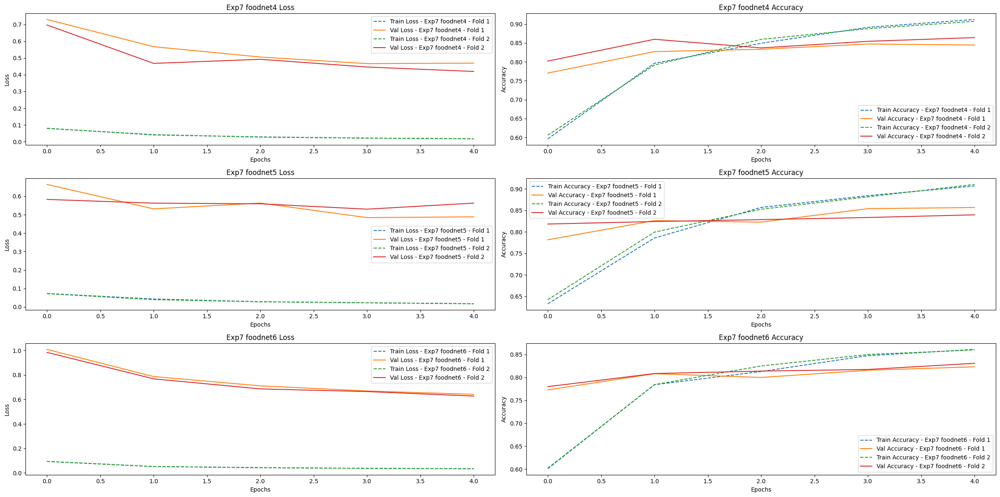

In [ ]:
plot_experiment_metrics(experiments4)

In [ ]:
# N.B.: Results shown below are semi-incorrect: The Val Loss does not match the Val Acc
# It's showing the max Val Loss and max Val Acc instead of the corresponding Val Acc at the lowest Val Loss
print_experiment_results(experiments4)

Experiment comparison based on validation:
Exp7 foodnet4) Val Loss: 0.7297 - Val Acc: 0.8643
Exp7 foodnet5) Val Loss: 0.6638 - Val Acc: 0.8567
Exp7 foodnet6) Val Loss: 1.0086 - Val Acc: 0.8308


In [ ]:
free_model_memory()

experiments5 = [
    CrossValidatedExperiment(
        name = "Exp11 foodnet6 Simple",
        model = foodnet6,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 32,
        epoch_count = 5,
        lr = 0.001,
        lr_linear_range = None,
        weight_decay = 0.001,
        patience = 2,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
        kfold = 2,
    ),
]

In [ ]:
for exp in experiments5:
    exp.train_all(device)

Training Exp11 foodnet6 Simple - Fold 1...
Epoch 1/5 - Train Loss: 0.0511 - Val Loss: 1.1472 - Train Accuracy: 0.5855 - Val Accuracy: 0.7424 - LR: 0.00100000
Saving model ./checkpoints/1/Exp11 foodnet6 Simple - Fold 1...
Epoch 2/5 - Train Loss: 0.0286 - Val Loss: 0.8618 - Train Accuracy: 0.7694 - Val Accuracy: 0.7826 - LR: 0.00100000
Saving model ./checkpoints/1/Exp11 foodnet6 Simple - Fold 1...
Epoch 3/5 - Train Loss: 0.0225 - Val Loss: 0.7457 - Train Accuracy: 0.8116 - Val Accuracy: 0.8049 - LR: 0.00100000
Saving model ./checkpoints/1/Exp11 foodnet6 Simple - Fold 1...
Epoch 4/5 - Train Loss: 0.0195 - Val Loss: 0.6967 - Train Accuracy: 0.8326 - Val Accuracy: 0.8076 - LR: 0.00100000
Saving model ./checkpoints/1/Exp11 foodnet6 Simple - Fold 1...
Epoch 5/5 - Train Loss: 0.0176 - Val Loss: 0.6505 - Train Accuracy: 0.8460 - Val Accuracy: 0.8107 - LR: 0.00100000
Saving model ./checkpoints/1/Exp11 foodnet6 Simple - Fold 1...
Training Exp11 foodnet6 Simple - Fold 2...
Epoch 1/5 - Train Loss: 

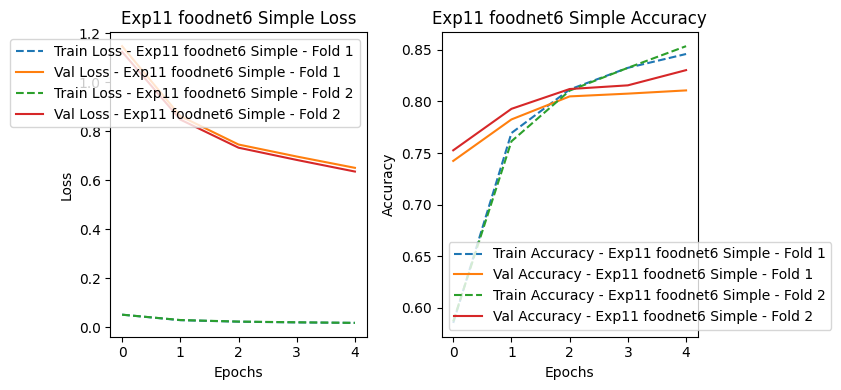

In [ ]:
plot_experiment_metrics(experiments5)

In [ ]:
# N.B.: Results shown below are semi-incorrect: The Val Loss does not match the Val Acc
# It's showing the max Val Loss and max Val Acc instead of the corresponding Val Acc at the lowest Val Loss
print_experiment_results(experiments5)

Experiment comparison based on validation:
Exp11 foodnet6 Simple) Val Loss: 1.1472 - Val Acc: 0.8304


Let's put all the results together for a better overview:

In [ ]:
# N.B.: Results shown below are semi-incorrect: The Val Loss does not match the Val Acc
# It's showing the max Val Loss and max Val Acc instead of the corresponding Val Acc at the lowest Val Loss
print_experiment_results(experiments3 + experiments4 + experiments5)

Experiment comparison based on validation:
Exp5 foodnet4) Val Loss: 0.8258 - Val Acc: 0.8670
Exp5 foodnet5) Val Loss: 0.6124 - Val Acc: 0.8625
Exp5 foodnet6) Val Loss: 1.0295 - Val Acc: 0.8277
Exp7 foodnet4) Val Loss: 0.7297 - Val Acc: 0.8643
Exp7 foodnet5) Val Loss: 0.6638 - Val Acc: 0.8567
Exp7 foodnet6) Val Loss: 1.0086 - Val Acc: 0.8308
Exp11 foodnet6 Simple) Val Loss: 1.1472 - Val Acc: 0.8304


From the looks of the metrics above, the hyper-parameters of Exp5 yielded better results compared to the ones of Exp7. <br>

Also, the overall validation accuracy reached 86,7%, roughly ~3% more than previous tests! <br>

Let's try to tune the foodnet4/5 architectures a bit to see if it's possible to squeeze some more out of them.

foodnet4_2 and foodnet5_2 will be identical to their first variant, except that the number of unfrozen bottleneck layers was increased to 3 instead of 2.

In [25]:
def foodnet4_2(num_classes):
    # Pre-trained base model based on ResNet
    model = resnet152(weights=ResNet152_Weights.IMAGENET1K_V2)

    # Freeze all trainable parameters of the pretrained model
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze last bottleneck block
    for param in model.layer4[-3:].parameters():
        param.requires_grad = True

    # Override classification layer with custom logic
    model.fc = nn.Sequential(
        nn.Linear(model.fc.in_features, 256),
        nn.ReLU(),
        nn.Dropout(0.33),
        nn.Linear(256, num_classes),
    )

    return model

def foodnet5_2(num_classes):
    # Pre-trained base model based on ResNet
    model = resnet152(weights=ResNet152_Weights.IMAGENET1K_V2)

    # Freeze all trainable parameters of the pretrained model
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze last bottleneck block
    for param in model.layer4[-3:].parameters():
        param.requires_grad = True

    # Override classification layer with custom logic
    model.fc =  nn.Linear(model.fc.in_features, num_classes)

    return model


In [27]:
exp5_foodnet_experiments = [
    CrossValidatedExperiment(
        name = "Exp5 foodnet5 Trained",
        model = foodnet5,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 10,
        lr = 0.001,
        lr_linear_range = (1.0, 0.8),
        weight_decay = 0.0001,
        patience = 3,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
    ),
    CrossValidatedExperiment(
        name = "Exp5 foodnet4_2 Trained2",
        model = foodnet4_2,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 10,
        lr = 0.001,
        lr_linear_range = (1.0, 0.8),
        weight_decay = 0.0001,
        patience = 3,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
    ),
    CrossValidatedExperiment(
        name = "Exp5 foodnet5_2 Trained3",
        model = foodnet5_2,
        optimizer = torch.optim.Adam,
        loss_fn = nn.CrossEntropyLoss,
        num_classes = num_classes,
        batch_size = 16,
        epoch_count = 10,
        lr = 0.001,
        lr_linear_range = (1.0, 0.8),
        weight_decay = 0.0001,
        patience = 3,
        min_delta = 0.001,
        trainset = train_image_folder,
        valset = val_image_folder,
    )
]

free_model_memory()

In [28]:
for exp in exp5_foodnet_experiments:
    exp.train_all(device)

Training Exp5 foodnet5 Trained - Fold 1...
Epoch 1/10 - Train Loss: 0.0655 - Val Loss: 0.5342 - Train Accuracy: 0.6789 - Val Accuracy: 0.8317 - LR: 0.00100000
Saving model ./checkpoints/1/Exp5 foodnet5 Trained - Fold 1...
Epoch 2/10 - Train Loss: 0.0374 - Val Loss: 0.6104 - Train Accuracy: 0.8128 - Val Accuracy: 0.8237 - LR: 0.00098000
Epoch 3/10 - Train Loss: 0.0257 - Val Loss: 0.4771 - Train Accuracy: 0.8674 - Val Accuracy: 0.8594 - LR: 0.00096000
Saving model ./checkpoints/1/Exp5 foodnet5 Trained - Fold 1...
Epoch 4/10 - Train Loss: 0.0201 - Val Loss: 0.4144 - Train Accuracy: 0.8954 - Val Accuracy: 0.8692 - LR: 0.00094000
Saving model ./checkpoints/1/Exp5 foodnet5 Trained - Fold 1...
Epoch 5/10 - Train Loss: 0.0169 - Val Loss: 0.4456 - Train Accuracy: 0.9146 - Val Accuracy: 0.8710 - LR: 0.00092000
Epoch 6/10 - Train Loss: 0.0143 - Val Loss: 0.4291 - Train Accuracy: 0.9238 - Val Accuracy: 0.8701 - LR: 0.00090000
Epoch 7/10 - Train Loss: 0.0127 - Val Loss: 0.4067 - Train Accuracy: 0.9

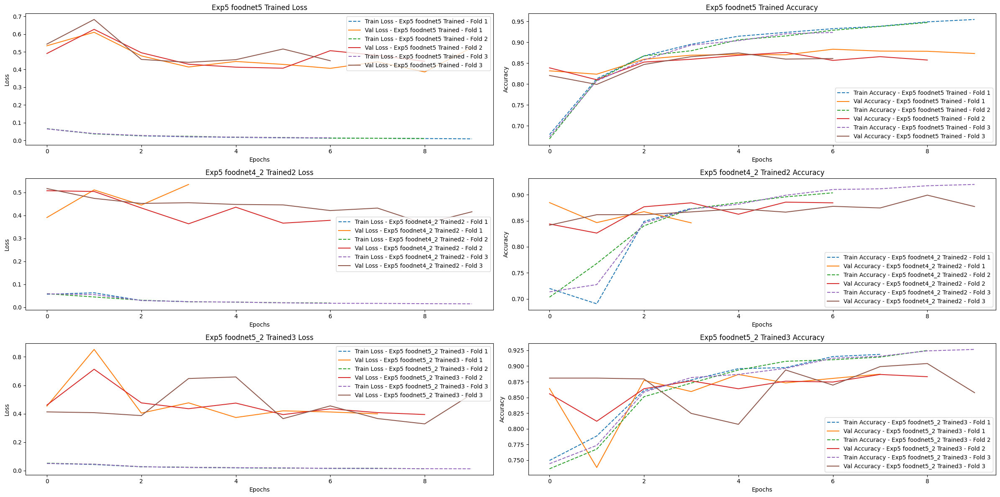

In [29]:
plot_experiment_metrics(exp5_foodnet_experiments)

In [32]:
# N.B.: This one shows the correct values for Val Loss. Bug was fixed
print_experiment_results(exp5_foodnet_experiments)

Experiment comparison based on validation:
Exp5 foodnet5 Trained) Val Loss: 0.3865 - Val Acc: 0.8786
Exp5 foodnet4_2 Trained2) Val Loss: 0.3638 - Val Acc: 0.8844
Exp5 foodnet5_2 Trained3) Val Loss: 0.3290 - Val Acc: 0.9040


We have a clear winner here among all the tests we've done up until now. <br>
The refined version of foodnet5 with 3 unfrozen bottleneck blocks and simple linear classification layer got the best results within 10 epochs. <br><br>

Let's run the training for this network for a longer period to see if it stabilizes at 90% or keeps increasing.

In [58]:
final_model = Experiment(
    name = "Exp5 foodnet5_2 Final",
    model = foodnet5_2,
    optimizer = torch.optim.Adam,
    loss_fn = nn.CrossEntropyLoss,
    num_classes = num_classes,
    batch_size = 16,
    epoch_count = 20,
    lr = 0.001,
    lr_linear_range = (1.0, 0.7),
    weight_decay = 0.0001,
    patience = 5,
    min_delta = 0.001,
    trainset_loader = trainset_loader,
    valset_loader = valset_loader,
)

free_model_memory()

Reload the model from the existing checkpoints so that we can resume from the previous state where it reached 90,40%:

In [59]:
final_model.load_model("./checkpoints/3/Exp5 foodnet5_2 Trained3 - Fold 3/model.pt")

In [44]:
preds, targets = eval_experiment(final_model, testset_loader, device)

Accuracy: 0.8996


Great! Even on the testset it's hitting almost the same as on the validation set from the previous training. <br>

Let's move on and continue the training process.

In [60]:
train_experiment(final_model, device)

Training Exp5 foodnet5_2 Final...
Epoch 1/20 - Train Loss: 0.0098 - Val Loss: 0.3091 - Train Accuracy: 0.9019 - Val Accuracy: 0.9107 - LR: 0.00100000
Saving model ./checkpoints/Exp5 foodnet5_2 Final...
Epoch 2/20 - Train Loss: 0.0092 - Val Loss: 0.4030 - Train Accuracy: 0.9026 - Val Accuracy: 0.8732 - LR: 0.00098500
Epoch 3/20 - Train Loss: 0.0073 - Val Loss: 0.3019 - Train Accuracy: 0.9211 - Val Accuracy: 0.9076 - LR: 0.00097000
Saving model ./checkpoints/Exp5 foodnet5_2 Final...
Epoch 4/20 - Train Loss: 0.0062 - Val Loss: 0.3694 - Train Accuracy: 0.9302 - Val Accuracy: 0.8920 - LR: 0.00095500
Epoch 5/20 - Train Loss: 0.0056 - Val Loss: 0.3356 - Train Accuracy: 0.9397 - Val Accuracy: 0.9089 - LR: 0.00094000
Epoch 6/20 - Train Loss: 0.0056 - Val Loss: 0.3433 - Train Accuracy: 0.9371 - Val Accuracy: 0.9000 - LR: 0.00092500
Epoch 7/20 - Train Loss: 0.0051 - Val Loss: 0.3115 - Train Accuracy: 0.9441 - Val Accuracy: 0.9174 - LR: 0.00091000
Epoch 8/20 - Train Loss: 0.0049 - Val Loss: 0.3000

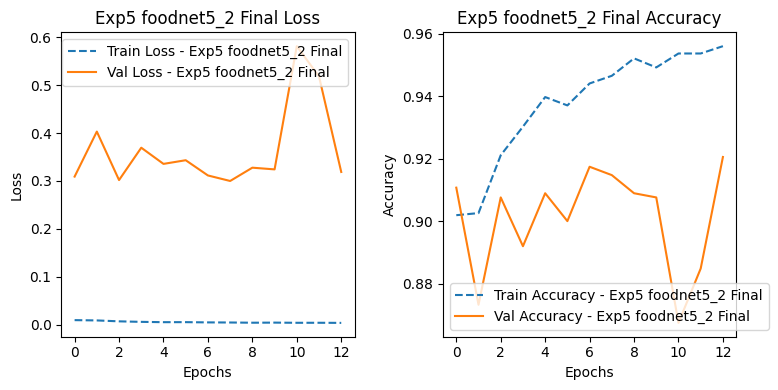

In [62]:
plot_experiment_metrics([final_model])

Load last saved checkpoint:

In [65]:
final_model.unload_model()

# Re-init model and optimizer since it's not stored within the Experiment class
final_model.model = foodnet5_2
final_model.optimizer = torch.optim.Adam
final_model.load_model("./checkpoints/Exp5 foodnet5_2 Final/model.pt")

In [77]:
predictions, targets = eval_experiment(final_model, testset_loader, device)

Accuracy: 0.9104


In [78]:
targets = np.array(targets)
predictions = np.array(predictions)

print("Misclassified samples: %d / %d" % ((targets != predictions).sum(), len(targets)))

Misclassified samples: 251 / 2800


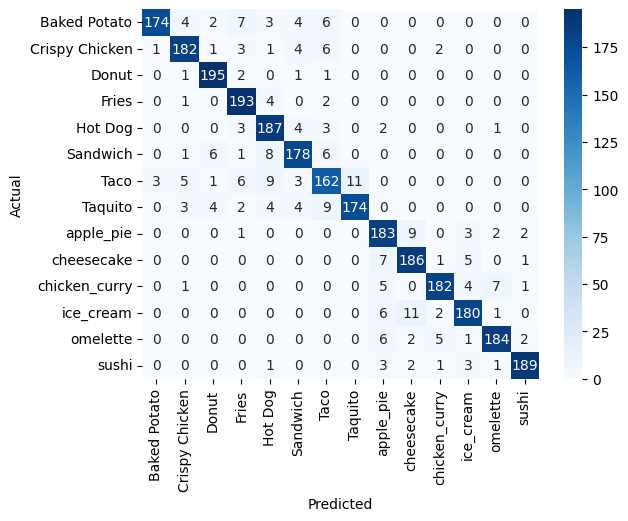

In [79]:
plot_confusion_matrix(targets, preds, test_image_folder.classes)

91,04% on the testset, and the confusion matrix looks much better than the previous one! <br>

Let's quickly check where it's still struggling:

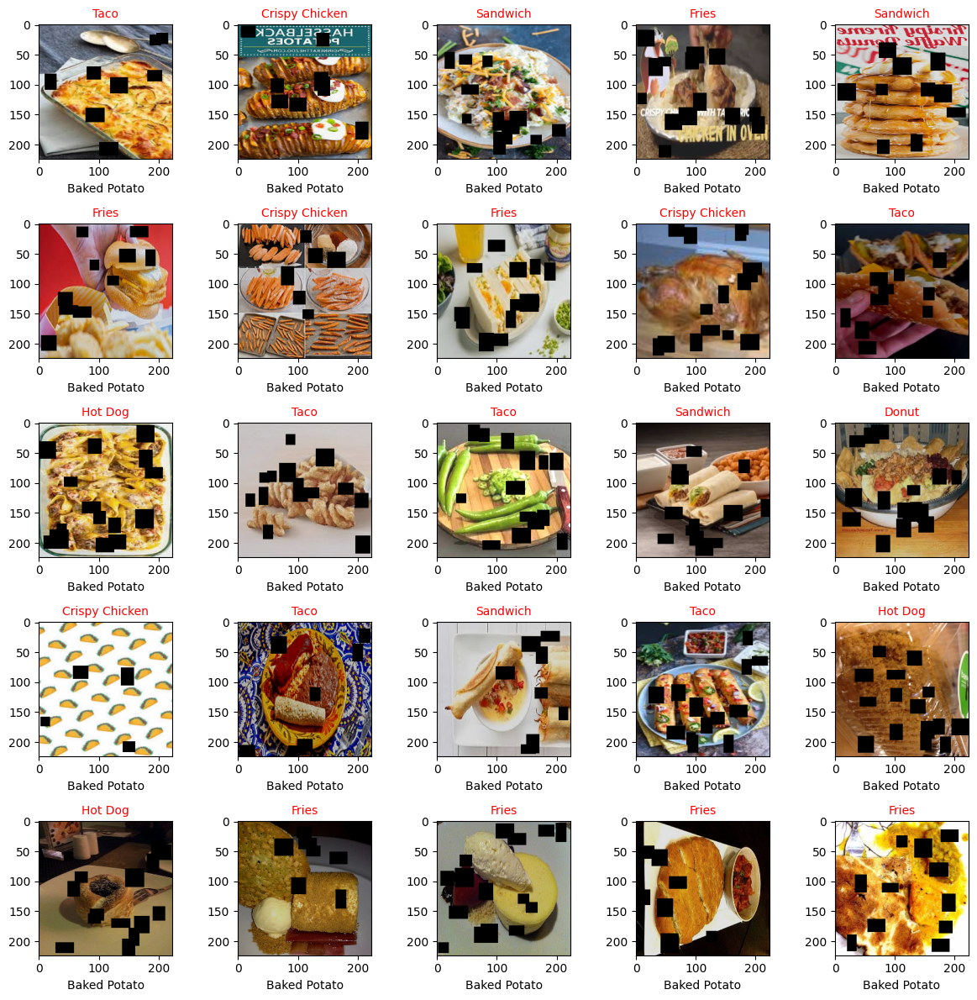

In [80]:
masked_testset_loader = DataLoader(test_image_folder, shuffle=False, sampler=MaskedSampler(test_image_folder, targets != predictions))

# Apply transformations used for the training set to see if it eventually disrupts
# the actual images and makes it harder to recognize
test_image_folder.transform = AlbumMediator(train_transforms)

# Plot some misclassified samples
grid_plot_dataloader(masked_testset_loader, targets, predictions, test_image_folder.classes, show_false_only=True, start_index=0)

# And set back the basic transforms for the testset
test_image_folder.transform = AlbumMediator(basic_transforms)

Overall there is still plenty of room for improvement because most of the images are still well recognizable.

# Conclusion
Fine-tuning a model, whether it is pre-trained or not, is quite challenging and needs to be done over multiple iterative trial and error attempts. <br><br>

For the given task, reaching 91% is quite good (actually 92% during validation but the loss didn't trigger the checkpoint save). Perhaps by tweaking the architecture a bit more, adding more augmentation and/or letting it run for some more epochs could squeeze out some more performance. <br><br>

Furthermore, memory constraints make the training process much harder and thus, understanding how pytorch handles allocations underneath is crucial for making this work smoothly (NVIDIA GTX 1060 3GB). <br><br>

Overall the validation accuracy went from 78-81% up to 91-92% by unfreezing the last 3 bottleneck blocks of ResNet152, applying a simple linear classification layer and weight decay.